In [16]:
import os
import torch
import pandas as pd
from PIL import Image
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms.functional as F

In [2]:
def load_data(txt_path, img_dir):
    with open(txt_path, 'r') as f:
        lines = f.readlines()
    data = []
    for line in lines:
        filename, angle = line.strip().split()
        data.append((os.path.join(img_dir, filename), float(angle)))
    return pd.DataFrame(data, columns=["image_path", "angle"])

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

In [3]:
class SteeringDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.df = dataframe.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        img_path = self.df.loc[idx, "image_path"]
        angle = self.df.loc[idx, "angle"]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        angle = torch.tensor(angle, dtype=torch.float32)  # <- fix is here
        return image, angle

In [6]:
source_b_df = load_data("source_b/labels.txt", "source_b/images")
source_b_train_df, source_b_val_df = train_test_split(source_b_df, test_size=0.2, random_state=42)

source_b_train_dataset = SteeringDataset(source_b_train_df, transform)
source_b_val_dataset = SteeringDataset(source_b_val_df, transform)

source_b_train_loader = DataLoader(source_b_train_dataset, batch_size=32, shuffle=True)
source_b_val_loader = DataLoader(source_b_val_dataset, batch_size=32)

In [13]:
def load_data_source_a(txt_path, img_dir):
    data = []
    with open(txt_path, 'r') as f:
        for line in f:
            try:
                filename, rest = line.strip().split(' ', 1)  # Only split once
                angle_str = rest.split(',')[0]  # Extract angle before comma
                angle = float(angle_str)
                data.append((os.path.join(img_dir, filename), angle))
            except Exception as e:
                print(f"Skipping line due to error: {line.strip()} | {e}")
                continue
    return pd.DataFrame(data, columns=["image_path", "angle"])
    
class SteeringDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.df = dataframe.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        img_path = self.df.loc[idx, "image_path"]
        angle = self.df.loc[idx, "angle"]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        angle = torch.tensor(angle, dtype=torch.float32) 
        return image, angle
        
source_a_df = load_data_source_a("source_a/labels.txt", "source_a/images")
source_a_train_df, source_a_val_df = train_test_split(source_a_df, test_size=0.2, random_state=42)

source_a_train_dataset = SteeringDataset(source_a_train_df, transform)
source_a_val_dataset = SteeringDataset(source_a_val_df, transform)

source_a_train_loader = DataLoader(source_a_train_dataset, batch_size=32, shuffle=True)
source_a_val_loader = DataLoader(source_a_val_dataset, batch_size=32)

In [19]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [20]:
class SimpleCNN(nn.Module):
    def __init__(self):
        super(SimpleCNN, self).__init__()
        self.conv_layers = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=5, stride=2, padding=2),
            nn.ReLU(),
            nn.Conv2d(16, 32, kernel_size=5, stride=2, padding=2),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=5, stride=2, padding=2),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=5, stride=2, padding=2),
            nn.ReLU(),
        )
        self.fc_layers = nn.Sequential(
            nn.Flatten(),
            nn.Linear(128 * 14 * 14, 256),
            nn.ReLU(),
            nn.Linear(256, 1)
        )

    def forward(self, x):
        x = self.conv_layers(x)
        x = self.fc_layers(x)
        return x

# Instantiate and load weights
model = SimpleCNN().to(device)
model.load_state_dict(torch.load('simple_cnn.pth'))
model.eval()

SimpleCNN(
  (conv_layers): Sequential(
    (0): Conv2d(3, 16, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (1): ReLU()
    (2): Conv2d(16, 32, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (3): ReLU()
    (4): Conv2d(32, 64, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (5): ReLU()
    (6): Conv2d(64, 128, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (7): ReLU()
  )
  (fc_layers): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=25088, out_features=256, bias=True)
    (2): ReLU()
    (3): Linear(in_features=256, out_features=1, bias=True)
  )
)

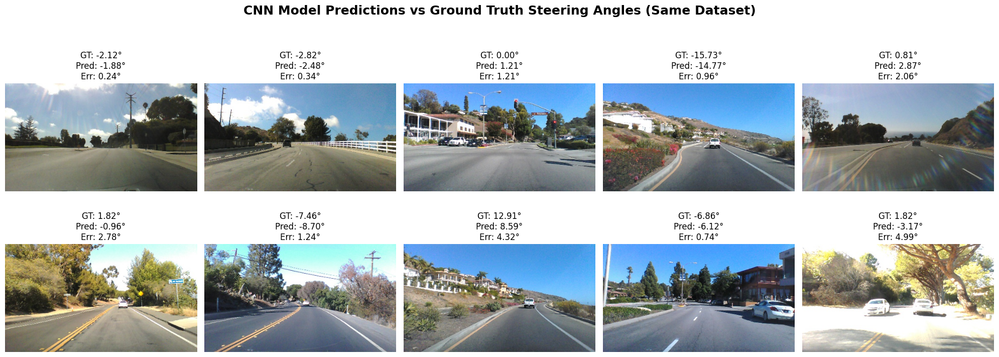

In [69]:
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from PIL import Image
import torch

model.eval()

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

num_samples = 10
rows, cols = 2, 5
fig, axs = plt.subplots(rows, cols, figsize=(20, 8))

for i in range(num_samples):
    img_path = source_b_val_df.iloc[i]["image_path"]
    true_angle = source_b_val_df.iloc[i]["angle"]

    image = Image.open(img_path).convert("RGB")
    input_tensor = transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        predicted_angle = model(input_tensor).item()

    error = abs(predicted_angle - true_angle)

    ax = axs[i // cols, i % cols]
    ax.imshow(image)
    ax.set_title(f"GT: {true_angle:.2f}°\nPred: {predicted_angle:.2f}°\nErr: {error:.2f}°")
    ax.axis("off")

plt.suptitle("CNN Model Predictions vs Ground Truth Steering Angles (Same Dataset)", fontsize=18, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])  
plt.show()

Test on Source B — MAE: 3.1561, RMSE: 9.5072


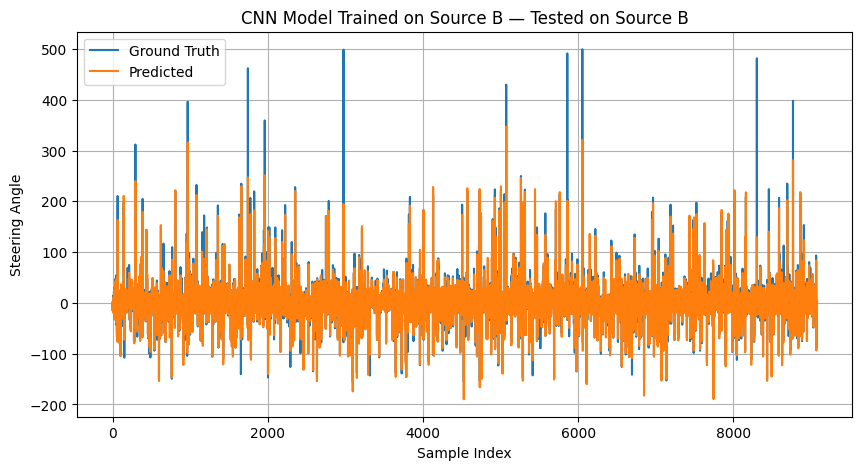

In [70]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
model.eval()

true_angles = []
pred_angles = []

with torch.no_grad():
    for images, angles in source_b_val_loader:
        images = images.to(device)
        angles = angles.numpy()
        outputs = model(images).squeeze(1).cpu().numpy()

        true_angles.extend(angles)
        pred_angles.extend(outputs)

mae = mean_absolute_error(true_angles, pred_angles)
mse = mean_squared_error(true_angles, pred_angles)
rmse = mse ** 0.5

print(f"Test on Source B — MAE: {mae:.4f}, RMSE: {rmse:.4f}")

plt.figure(figsize=(10, 5))
plt.plot(true_angles, label="Ground Truth")
plt.plot(pred_angles, label="Predicted")
plt.title("CNN Model Trained on Source B — Tested on Source B")
plt.xlabel("Sample Index")
plt.ylabel("Steering Angle")
plt.legend()
plt.grid(True)
plt.show()

Test on Source A — MAE: 16.2020, RMSE: 28.3953


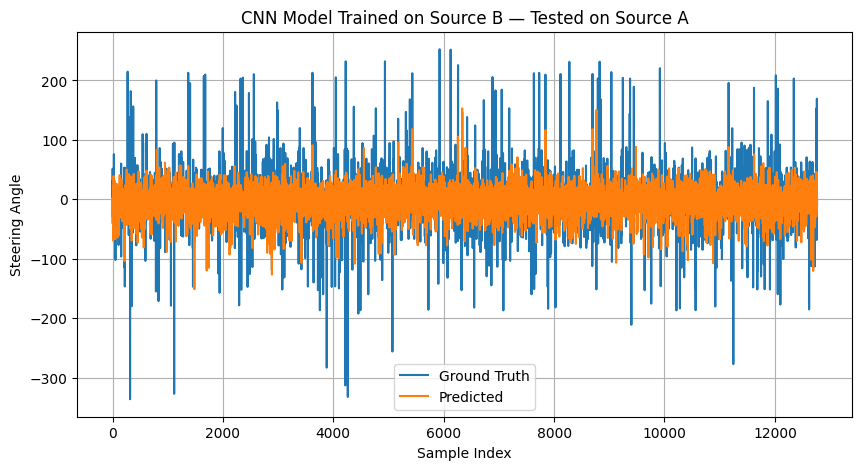

In [71]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
model.eval()

true_angles = []
pred_angles = []

with torch.no_grad():
    for images, angles in source_a_val_loader:
        images = images.to(device)
        angles = angles.numpy()
        outputs = model(images).squeeze(1).cpu().numpy()

        true_angles.extend(angles)
        pred_angles.extend(outputs)

mae = mean_absolute_error(true_angles, pred_angles)
mse = mean_squared_error(true_angles, pred_angles)
rmse = mse ** 0.5

print(f"Test on Source A — MAE: {mae:.4f}, RMSE: {rmse:.4f}")

plt.figure(figsize=(10, 5))
plt.plot(true_angles, label="Ground Truth")
plt.plot(pred_angles, label="Predicted")
plt.title("CNN Model Trained on Source B — Tested on Source A")
plt.xlabel("Sample Index")
plt.ylabel("Steering Angle")
plt.legend()
plt.grid(True)
plt.show()

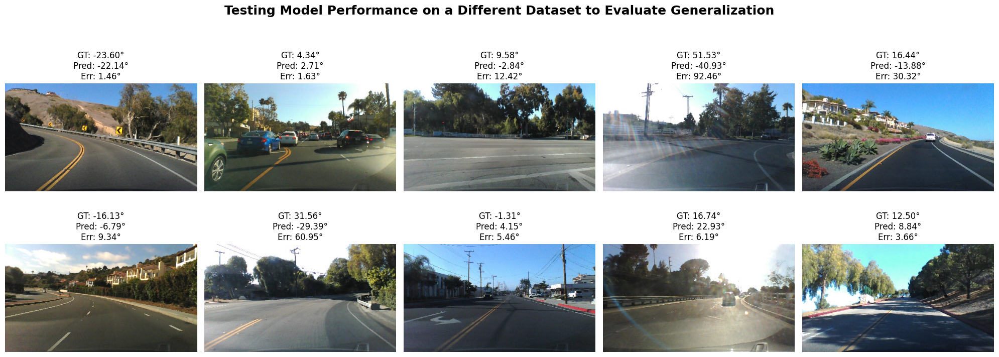

In [34]:
model.eval()

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

num_samples = 10
rows, cols = 2, 5
fig, axs = plt.subplots(rows, cols, figsize=(20, 8))

for i in range(num_samples):
    img_path = source_a_val_df.iloc[i]["image_path"]
    true_angle = source_a_val_df.iloc[i]["angle"]

    image = Image.open(img_path).convert("RGB")
    input_tensor = transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        predicted_angle = model(input_tensor).item()

    error = abs(predicted_angle - true_angle)

    ax = axs[i // cols, i % cols]
    ax.imshow(image)
    ax.set_title(f"GT: {true_angle:.2f}°\nPred: {predicted_angle:.2f}°\nErr: {error:.2f}°")
    ax.axis("off")

fig.suptitle(
    "Testing CNN Model Performance on a Different Dataset to Evaluate Generalization",
    fontsize=18, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])  
plt.show()

# ViT

In [35]:
class ViTRegressor(nn.Module):
    def __init__(self):
        super().__init__()
        self.backbone = timm.create_model('vit_base_patch16_224', pretrained=True, num_classes=0)
        self.head = nn.Linear(self.backbone.num_features, 1)

    def forward(self, x):
        x = self.backbone(x)
        return self.head(x)

In [38]:
import timm
vit_model = ViTRegressor()
vit_model.load_state_dict(torch.load("model_vit_sourceb.pth", map_location=torch.device('cpu')))  # or 'cuda' if using GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vit_model.to(device)

vit_model.eval()

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

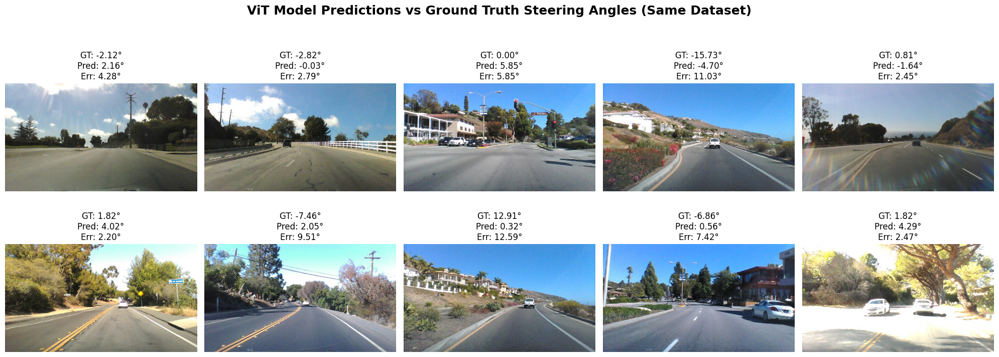

In [39]:
num_samples = 10
rows, cols = 2, 5
fig, axs = plt.subplots(rows, cols, figsize=(20, 8))

for i in range(num_samples):
    img_path = source_b_val_df.iloc[i]["image_path"]
    true_angle = source_b_val_df.iloc[i]["angle"]

    image = Image.open(img_path).convert("RGB")
    input_tensor = transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        predicted_angle = vit_model(input_tensor).item()

    error = abs(predicted_angle - true_angle)

    ax = axs[i // cols, i % cols]
    ax.imshow(image)
    ax.set_title(f"GT: {true_angle:.2f}°\nPred: {predicted_angle:.2f}°\nErr: {error:.2f}°")
    ax.axis("off")

plt.suptitle("ViT Model Predictions vs Ground Truth Steering Angles (Same Dataset)", fontsize=18, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])  
plt.show()

ViT Model Test on Source B — MAE: 14.7592, RMSE: 30.0231


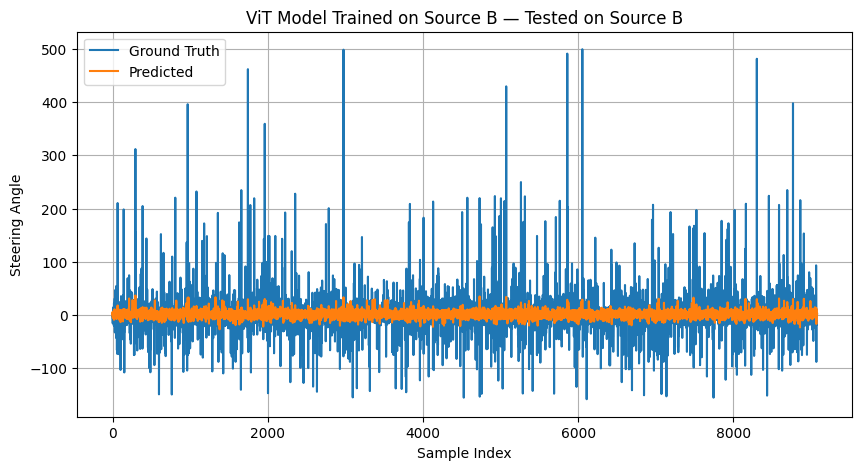

In [41]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
vit_model.eval()

true_angles = []
pred_angles = []

with torch.no_grad():
    for images, angles in source_b_val_loader:
        images = images.to(device)
        angles = angles.numpy()
        outputs = vit_model(images).squeeze(1).cpu().numpy()

        true_angles.extend(angles)
        pred_angles.extend(outputs)

mae = mean_absolute_error(true_angles, pred_angles)
mse = mean_squared_error(true_angles, pred_angles)
rmse = mse ** 0.5

print(f"ViT Model Test on Source B — MAE: {mae:.4f}, RMSE: {rmse:.4f}")

plt.figure(figsize=(10, 5))
plt.plot(true_angles, label="Ground Truth")
plt.plot(pred_angles, label="Predicted")
plt.title("ViT Model Trained on Source B — Tested on Source B")
plt.xlabel("Sample Index")
plt.ylabel("Steering Angle")
plt.legend()
plt.grid(True)
plt.show()

ViT Model Test on Source A — MAE: 13.3811, RMSE: 27.1226


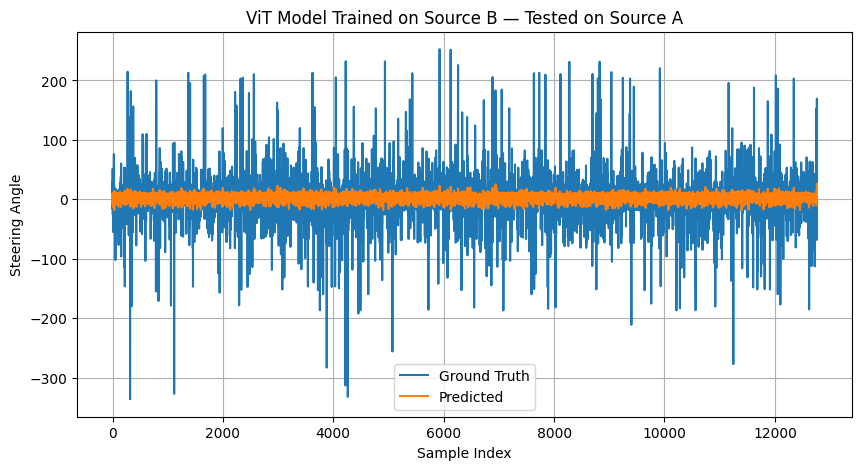

In [42]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
vit_model.eval()

true_angles = []
pred_angles = []

with torch.no_grad():
    for images, angles in source_a_val_loader:
        images = images.to(device)
        angles = angles.numpy()
        outputs = vit_model(images).squeeze(1).cpu().numpy()

        true_angles.extend(angles)
        pred_angles.extend(outputs)

mae = mean_absolute_error(true_angles, pred_angles)
mse = mean_squared_error(true_angles, pred_angles)
rmse = mse ** 0.5

print(f"ViT Model Test on Source A — MAE: {mae:.4f}, RMSE: {rmse:.4f}")

plt.figure(figsize=(10, 5))
plt.plot(true_angles, label="Ground Truth")
plt.plot(pred_angles, label="Predicted")
plt.title("ViT Model Trained on Source B — Tested on Source A")
plt.xlabel("Sample Index")
plt.ylabel("Steering Angle")
plt.legend()
plt.grid(True)
plt.show()

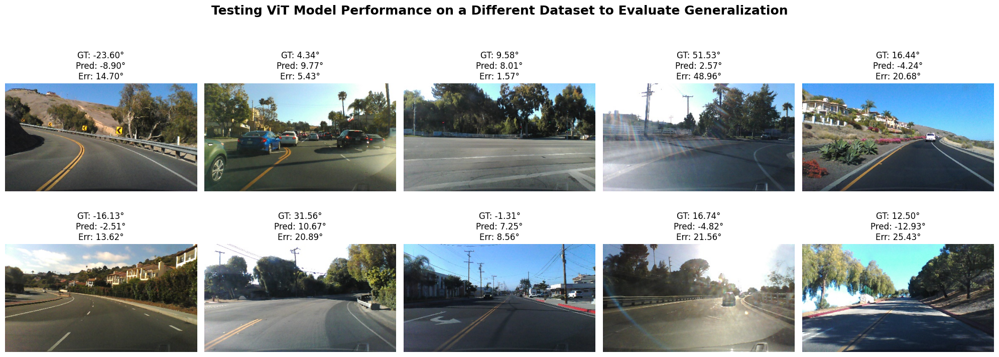

In [43]:
samples = 10
rows, cols = 2, 5
fig, axs = plt.subplots(rows, cols, figsize=(20, 8))

for i in range(num_samples):
    img_path = source_a_val_df.iloc[i]["image_path"]
    true_angle = source_a_val_df.iloc[i]["angle"]

    image = Image.open(img_path).convert("RGB")
    input_tensor = transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        predicted_angle = vit_model(input_tensor).item()

    error = abs(predicted_angle - true_angle)

    ax = axs[i // cols, i % cols]
    ax.imshow(image)
    ax.set_title(f"GT: {true_angle:.2f}°\nPred: {predicted_angle:.2f}°\nErr: {error:.2f}°")
    ax.axis("off")

fig.suptitle(
    "Testing ViT Model Performance on a Different Dataset to Evaluate Generalization",
    fontsize=18, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])  
plt.show()

# Swin ViT

In [47]:
from timm import create_model
class SwinRegressor(nn.Module):
    def __init__(self):
        super(SwinRegressor, self).__init__()
        # Load Swin-B pretrained on ImageNet, remove classifier head
        self.backbone = create_model('swin_base_patch4_window7_224', pretrained=True, num_classes=0)
        # Add regression head
        self.regressor = nn.Sequential(
            nn.Linear(self.backbone.num_features, 256),
            nn.ReLU(),
            nn.Linear(256, 1)
        )

    def forward(self, x):
        x = self.backbone(x)
        x = self.regressor(x)
        return x

In [55]:
swin_model = SwinRegressor()
swin_model.load_state_dict(torch.load("swin_model_vit_sourceb.pth", map_location=torch.device('cpu')))  # or 'cuda'

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
swin_model.to(device)

swin_model.eval()

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

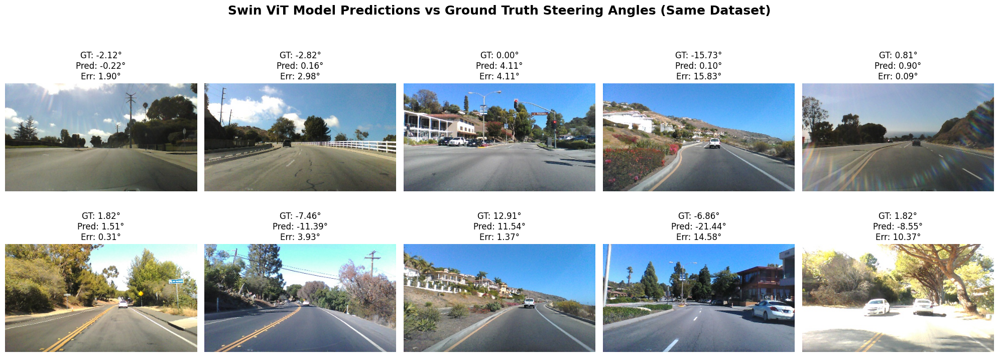

In [68]:
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from PIL import Image
import torch

swin_model.eval()

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

num_samples = 10
rows, cols = 2, 5
fig, axs = plt.subplots(rows, cols, figsize=(20, 8))

for i in range(num_samples):
    img_path = source_b_val_df.iloc[i]["image_path"]
    true_angle = source_b_val_df.iloc[i]["angle"]

    image = Image.open(img_path).convert("RGB")
    input_tensor = transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        predicted_angle = swin_model(input_tensor).item()

    error = abs(predicted_angle - true_angle)

    ax = axs[i // cols, i % cols]
    ax.imshow(image)
    ax.set_title(f"GT: {true_angle:.2f}°\nPred: {predicted_angle:.2f}°\nErr: {error:.2f}°")
    ax.axis("off")

plt.suptitle("Swin ViT Model Predictions vs Ground Truth Steering Angles (Same Dataset)", fontsize=18, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])  
plt.show()

Test on Source B — MAE: 11.0800, RMSE: 26.1551


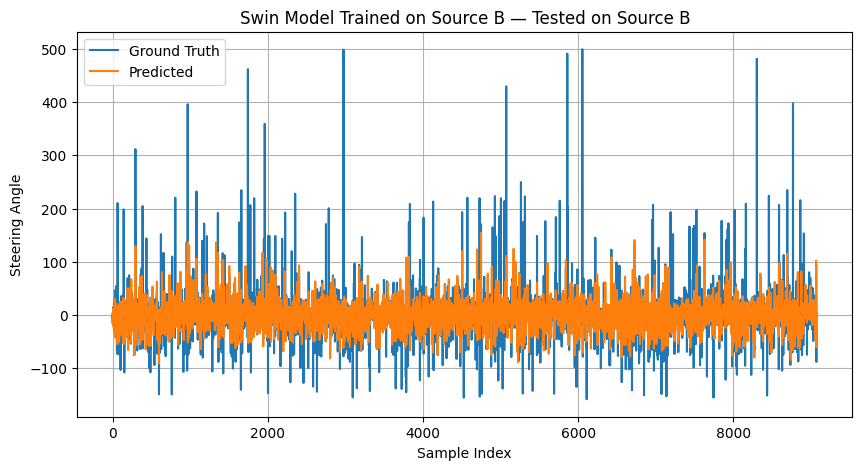

In [51]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
swin_model.eval()

true_angles = []
pred_angles = []

with torch.no_grad():
    for images, angles in source_b_val_loader:
        images = images.to(device)
        angles = angles.numpy()
        outputs = swin_model(images).squeeze(1).cpu().numpy()

        true_angles.extend(angles)
        pred_angles.extend(outputs)

mae = mean_absolute_error(true_angles, pred_angles)
mse = mean_squared_error(true_angles, pred_angles)
rmse = mse ** 0.5

print(f"Test on Source B — MAE: {mae:.4f}, RMSE: {rmse:.4f}")

plt.figure(figsize=(10, 5))
plt.plot(true_angles, label="Ground Truth")
plt.plot(pred_angles, label="Predicted")
plt.title("Swin Model Trained on Source B — Tested on Source B")
plt.xlabel("Sample Index")
plt.ylabel("Steering Angle")
plt.legend()
plt.grid(True)
plt.show()

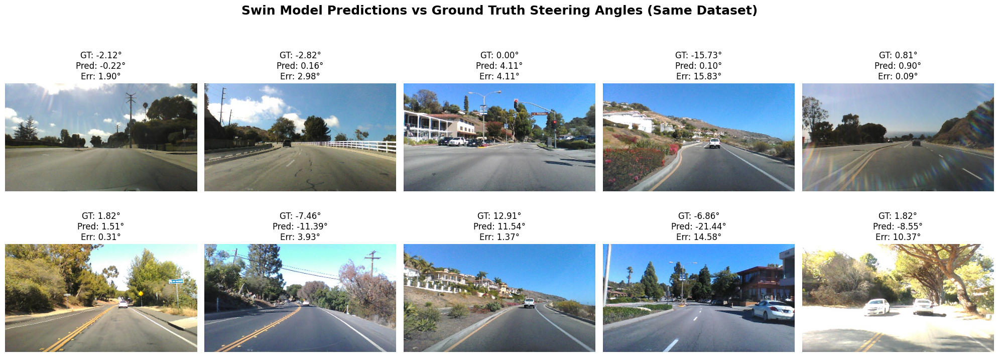

In [53]:
num_samples = 10
rows, cols = 2, 5
fig, axs = plt.subplots(rows, cols, figsize=(20, 8))

for i in range(num_samples):
    img_path = source_b_val_df.iloc[i]["image_path"]
    true_angle = source_b_val_df.iloc[i]["angle"]

    image = Image.open(img_path).convert("RGB")
    input_tensor = transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        predicted_angle = swin_model(input_tensor).item()

    error = abs(predicted_angle - true_angle)

    ax = axs[i // cols, i % cols]
    ax.imshow(image)
    ax.set_title(f"GT: {true_angle:.2f}°\nPred: {predicted_angle:.2f}°\nErr: {error:.2f}°")
    ax.axis("off")

plt.suptitle("Swin Model Predictions vs Ground Truth Steering Angles (Same Dataset)", fontsize=18, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])  
plt.show()

Test on Source A — MAE: 13.3747, RMSE: 25.6100


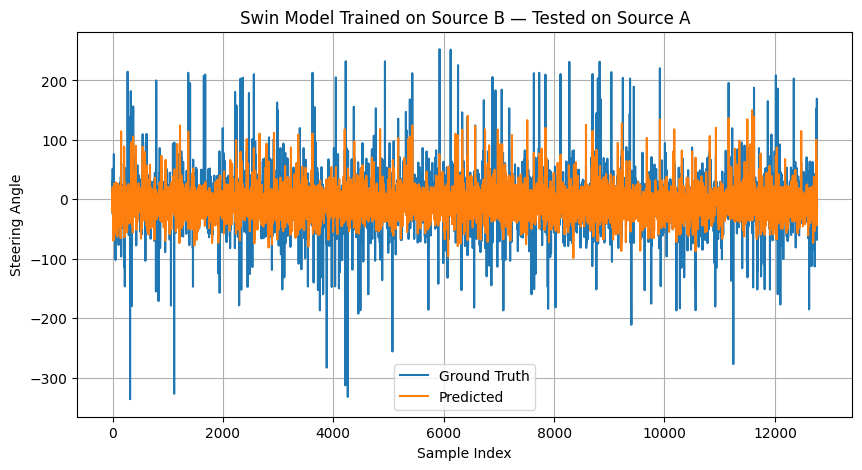

In [52]:
true_angles = []
pred_angles = []

with torch.no_grad():
    for images, angles in source_a_val_loader:
        images = images.to(device)
        angles = angles.numpy()
        outputs = swin_model(images).squeeze(1).cpu().numpy()

        true_angles.extend(angles)
        pred_angles.extend(outputs)

mae = mean_absolute_error(true_angles, pred_angles)
mse = mean_squared_error(true_angles, pred_angles)
rmse = mse ** 0.5

print(f"Test on Source A — MAE: {mae:.4f}, RMSE: {rmse:.4f}")

plt.figure(figsize=(10, 5))
plt.plot(true_angles, label="Ground Truth")
plt.plot(pred_angles, label="Predicted")
plt.title("Swin Model Trained on Source B — Tested on Source A")
plt.xlabel("Sample Index")
plt.ylabel("Steering Angle")
plt.legend()
plt.grid(True)
plt.show()

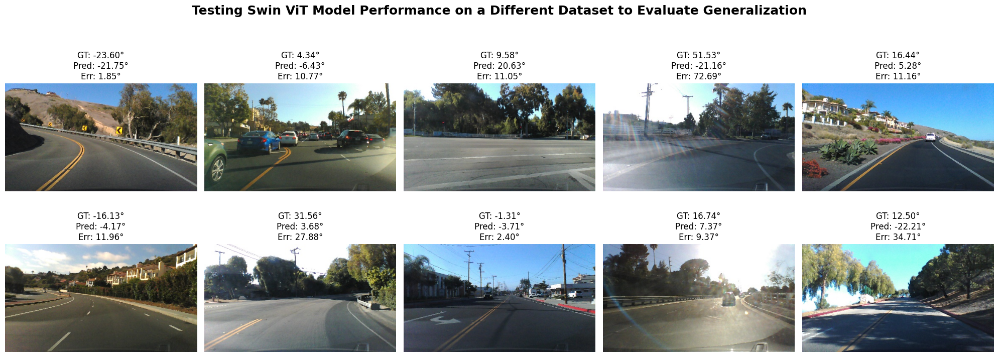

In [54]:
samples = 10
rows, cols = 2, 5
fig, axs = plt.subplots(rows, cols, figsize=(20, 8))

for i in range(num_samples):
    img_path = source_a_val_df.iloc[i]["image_path"]
    true_angle = source_a_val_df.iloc[i]["angle"]

    image = Image.open(img_path).convert("RGB")
    input_tensor = transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        predicted_angle = swin_model(input_tensor).item()

    error = abs(predicted_angle - true_angle)

    ax = axs[i // cols, i % cols]
    ax.imshow(image)
    ax.set_title(f"GT: {true_angle:.2f}°\nPred: {predicted_angle:.2f}°\nErr: {error:.2f}°")
    ax.axis("off")

fig.suptitle(
    "Testing Swin ViT Model Performance on a Different Dataset to Evaluate Generalization",
    fontsize=18, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])  
plt.show()

In [59]:
import torch
import torch.nn.functional as F
from torchvision import transforms
import matplotlib.pyplot as plt
import numpy as np
import cv2

model.eval()

img_path = 'source_a/images/10003.jpg'  # replace with your image
raw_img = cv2.imread(img_path)
img_rgb = cv2.cvtColor(raw_img, cv2.COLOR_BGR2RGB)

input_tensor = transform(img_rgb).unsqueeze(0).to(device)


/Users/ashwin/miniconda3/envs/mlproj/lib/python3.10/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


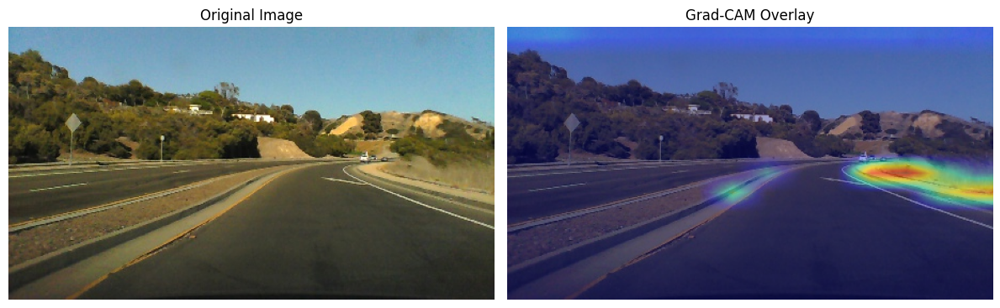

In [60]:
feature_maps = []
gradients = []

def forward_hook(module, input, output):
    feature_maps.append(output)

def backward_hook(module, grad_in, grad_out):
    gradients.append(grad_out[0])

# Hook into the last conv layer (index 6)
target_layer = model.conv_layers[6]
target_layer.register_forward_hook(forward_hook)
target_layer.register_backward_hook(backward_hook)

# ------------ Forward + Backward ------------
output = model(input_tensor)
output.backward()

# ------------ Generate CAM ------------
grads = gradients[0].detach().cpu().numpy()[0]
fmap = feature_maps[0].detach().cpu().numpy()[0]

weights = np.mean(grads, axis=(1, 2))
cam = np.zeros(fmap.shape[1:], dtype=np.float32)

for i, w in enumerate(weights):
    cam += w * fmap[i]

cam = np.maximum(cam, 0)
cam = cam - cam.min()
cam = cam / cam.max()
cam = cv2.resize(cam, (img_rgb.shape[1], img_rgb.shape[0]))

# ------------ Overlay CAM on image ------------
heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
overlay = cv2.addWeighted(cv2.cvtColor(img_rgb, cv2.COLOR_RGB2BGR), 0.6, heatmap, 0.4, 0)

# ------------ Show result ------------
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(overlay[:, :, ::-1])  
plt.title("Grad-CAM Overlay")
plt.axis("off")
plt.tight_layout()
plt.show()

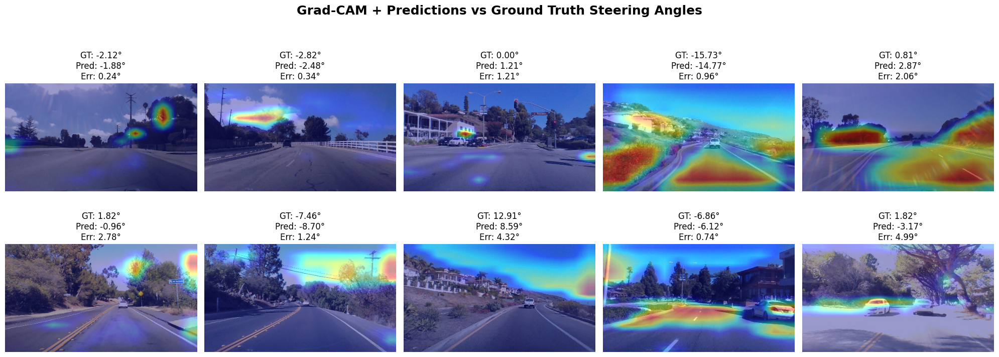

In [61]:
import torch
import torch.nn.functional as F
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import cv2

# Set model to eval mode
model.eval()

# Hook containers
feature_maps = []
gradients = []

# Hook functions
def forward_hook(module, input, output):
    feature_maps.append(output)

def backward_hook(module, grad_in, grad_out):
    gradients.append(grad_out[0])

# Register hooks on the last conv layer
target_layer = model.conv_layers[6]
target_layer.register_forward_hook(forward_hook)
target_layer.register_backward_hook(backward_hook)

# Image transform
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

# Plot setup
num_samples = 10
rows, cols = 2, 5
fig, axs = plt.subplots(rows, cols, figsize=(20, 8))

for i in range(num_samples):
    img_path = source_b_val_df.iloc[i]["image_path"]
    true_angle = source_b_val_df.iloc[i]["angle"]

    image = Image.open(img_path).convert("RGB")
    img_rgb = np.array(image)
    input_tensor = transform(image).unsqueeze(0).to(device)

    # Clear previous values
    feature_maps.clear()
    gradients.clear()

    # Forward + Backward pass
    output = model(input_tensor)
    output.backward()

    # Grad-CAM
    grads = gradients[0].detach().cpu().numpy()[0]
    fmap = feature_maps[0].detach().cpu().numpy()[0]
    weights = np.mean(grads, axis=(1, 2))
    cam = np.zeros(fmap.shape[1:], dtype=np.float32)
    for j, w in enumerate(weights):
        cam += w * fmap[j]
    cam = np.maximum(cam, 0)
    cam = (cam - cam.min()) / (cam.max() + 1e-8)
    cam = cv2.resize(cam, (img_rgb.shape[1], img_rgb.shape[0]))
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(cv2.cvtColor(img_rgb, cv2.COLOR_RGB2BGR), 0.6, heatmap, 0.4, 0)

    # Display
    predicted_angle = output.item()
    error = abs(predicted_angle - true_angle)

    ax = axs[i // cols, i % cols]
    ax.imshow(overlay[:, :, ::-1])  # BGR to RGB
    ax.set_title(f"GT: {true_angle:.2f}°\nPred: {predicted_angle:.2f}°\nErr: {error:.2f}°")
    ax.axis("off")

plt.suptitle("Grad-CAM + Predictions vs Ground Truth Steering Angles", fontsize=18, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

/Users/ashwin/miniconda3/envs/mlproj/lib/python3.10/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)
/Users/ashwin/miniconda3/envs/mlproj/lib/python3.10/site-packages/scipy/ndimage/_measurements.py:1548: RuntimeWarning: invalid value encountered in scalar divide
  results = [sum_labels(input * grids[dir].astype(float), labels, index) / normalizer


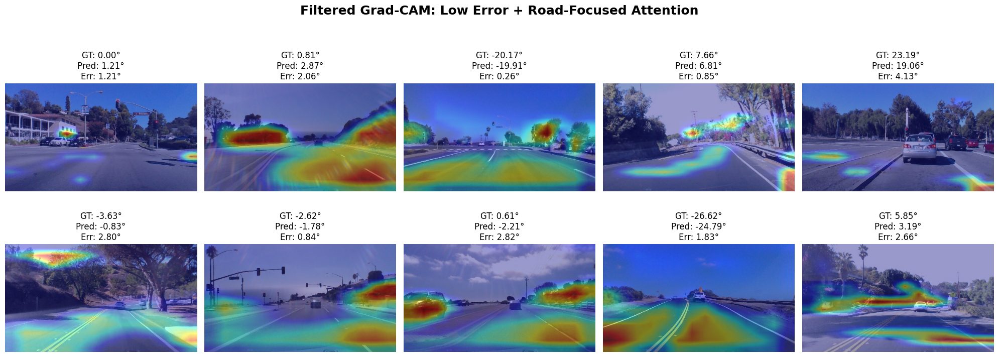

In [66]:
import torch
import torch.nn.functional as F
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import cv2
from scipy.ndimage import center_of_mass

model.eval()

feature_maps = []
gradients = []

def forward_hook(module, input, output):
    feature_maps.append(output)

def backward_hook(module, grad_in, grad_out):
    gradients.append(grad_out[0])

target_layer = model.conv_layers[6]
target_layer.register_forward_hook(forward_hook)
target_layer.register_backward_hook(backward_hook)


transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

ERROR_THRESHOLD = 5.0  # degrees
CAM_CENTER_REGION = {
    'x': (0.3, 0.7),  # horizontal: center
    'y': (0.6, 0.95)  # vertical: near bottom
}

num_samples = 10
rows, cols = 2, 5
fig, axs = plt.subplots(rows, cols, figsize=(20, 8))

good_count = 0
i = 0
    
while good_count < num_samples and i < len(source_b_val_df):
    img_path = source_b_val_df.iloc[i]["image_path"]
    true_angle = source_b_val_df.iloc[i]["angle"]
    i += 1

    image = Image.open(img_path).convert("RGB")
    img_rgb = np.array(image)
    input_tensor = transform(image).unsqueeze(0).to(device)

    # Clear previous values
    feature_maps.clear()
    gradients.clear()

    # Forward + Backward pass
    output = model(input_tensor)
    output.backward()

    # Grad-CAM computation
    grads = gradients[0].detach().cpu().numpy()[0]
    fmap = feature_maps[0].detach().cpu().numpy()[0]
    weights = np.mean(grads, axis=(1, 2))
    cam = np.zeros(fmap.shape[1:], dtype=np.float32)
    for j, w in enumerate(weights):
        cam += w * fmap[j]
    cam = np.maximum(cam, 0)
    cam = (cam - cam.min()) / (cam.max() + 1e-8)

    # Center of mass
    cy, cx = center_of_mass(cam)
    h, w = cam.shape
    cx_norm = cx / w
    cy_norm = cy / h

    predicted_angle = output.item()
    error = abs(predicted_angle - true_angle)

    # Check filtering conditions
    if (error < ERROR_THRESHOLD and
        CAM_CENTER_REGION['x'][0] <= cx_norm <= CAM_CENTER_REGION['x'][1] and
        CAM_CENTER_REGION['y'][0] <= cy_norm <= CAM_CENTER_REGION['y'][1]):

        # Generate overlay
        cam_resized = cv2.resize(cam, (img_rgb.shape[1], img_rgb.shape[0]))
        heatmap = cv2.applyColorMap(np.uint8(255 * cam_resized), cv2.COLORMAP_JET)
        overlay = cv2.addWeighted(cv2.cvtColor(img_rgb, cv2.COLOR_RGB2BGR), 0.6, heatmap, 0.4, 0)

        # Display
        ax = axs[good_count // cols, good_count % cols]
        ax.imshow(overlay[:, :, ::-1])  # BGR to RGB
        ax.set_title(f"GT: {true_angle:.2f}°\nPred: {predicted_angle:.2f}°\nErr: {error:.2f}°")
        ax.axis("off")

        good_count += 1

plt.suptitle("Filtered Grad-CAM: Low Error + Road-Focused Attention", fontsize=18, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [78]:
import torch
import torch.nn as nn
from torchvision import transforms
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2
from timm import create_model
from types import MethodType

model = swin_model
model.eval()

# -------- 2. Hook attention weights --------
attn_weights = []

def custom_forward(self, x, mask=None):
    B_, N, C = x.shape
    qkv = self.qkv(x).reshape(B_, N, 3, self.num_heads, C // self.num_heads).permute(2, 0, 3, 1, 4)
    q, k, v = qkv[0], qkv[1], qkv[2]
    attn = (q @ k.transpose(-2, -1)) * self.scale

    if mask is not None:
        num_windows = mask.shape[0]
        attn = attn.view(B_ // num_windows, num_windows, self.num_heads, N, N) + mask.unsqueeze(1).unsqueeze(0)
        attn = attn.view(-1, self.num_heads, N, N)

    attn = self.softmax(attn)
    attn_weights.append(attn.detach())  # Store attention
    attn = self.attn_drop(attn)

    x = (attn @ v).transpose(1, 2).reshape(B_, N, C)
    x = self.proj(x)
    x = self.proj_drop(x)
    return x

# Patch attention forward for the last Swin stage
for blk in model.backbone.layers[-1].blocks:
    blk.attn.forward = MethodType(custom_forward, blk.attn)

# -------- 3. Image preprocessing --------
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

# Replace with your image path
img_path = 'source_a/images/10003.jpg'  # <-- change to your real path
image = Image.open(img_path).convert('RGB')
input_tensor = transform(image).unsqueeze(0)
input_tensor.requires_grad_()

# -------- 4. Forward + Backward --------
output = model(input_tensor)
score = output.squeeze()
score.backward()

# -------- 5. Attention Rollout --------
with torch.no_grad():
    result = torch.eye(attn_weights[0].size(-1)).to(input_tensor.device)
    for attn in attn_weights:
        attn_mean = attn.mean(dim=1)  # (B*nW, N, N)
        attn_mean = attn_mean / attn_mean.sum(dim=-1, keepdim=True)
        result = attn_mean @ result

    rollout = result.mean(dim=0).cpu().numpy().reshape(14, 14)  # mean over tokens
    rollout = cv2.resize(rollout, (224, 224))
    rollout = (rollout - rollout.min()) / (rollout.max() - rollout.min())

# -------- 6. Overlay Heatmap --------
image_np = np.array(image.resize((224, 224))) / 255.0
heatmap = cv2.applyColorMap(np.uint8(255 * rollout), cv2.COLORMAP_JET)
overlay = 0.6 * image_np + 0.4 * heatmap[..., ::-1] / 255.0

plt.imshow(overlay)
plt.title(f"Swin Attention Rollout (Regression Output: {score.item():.2f})")
plt.axis('off')
plt.tight_layout()
plt.show()

IndexError: index 1 is out of bounds for dimension 0 with size 1